# Classes of skin cancer lesions
## Carcinoma Basocelular (bcc)
## Carcinoma Espinocelular (akiec)

*   Melanocytic nevi (nv)
*   Melanoma (mel)
*   Benign keratosis-like lesions (bkl)
*   Basal cell carcinoma (bcc)
*   Actinic keratoses (akiec)
*   Vascular lesions (vas)
*   Dermatofibroma (df)

Enfermedades Malignas

* Melanoma (mel): Cáncer de piel muy agresivo, puede hacer metástasis.
* Basal cell carcinoma (bcc): Cáncer de piel, menos agresivo, crece lentamente.
* Actinic keratoses (akiec): Lesión precancerosa, puede evolucionar a carcinoma escamoso.


Enfermedades Benignas

* Melanocytic nevi (nv): Lunares comunes, generalmente inofensivos.
* Benign keratosis-like lesions (bkl): Manchas benignas, pueden confundirse con cáncer.
* Vascular lesions (vas): Lesiones en vasos sanguíneos, pueden ser angiomas o hemangiomas.
*  Dermatofibroma (df): Pequeños nódulos benignos en la piel, sin riesgo de cáncer.









In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import os
from os import read
import pandas as pd
from scipy.interpolate import griddata
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image
import cv2
from skimage.feature import graycomatrix, graycoprops
from skimage import img_as_ubyte
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score, confusion_matrix
from scipy.stats import kruskal
from sklearn.utils import resample
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, f1_score, roc_curve
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Reemplaza con la ruta correcta si está en otra carpeta
file_path = '/content/drive/MyDrive/Cancer/HAM10000_metadata.csv'

df = pd.read_csv(file_path)
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


# Análisis de Metadatos

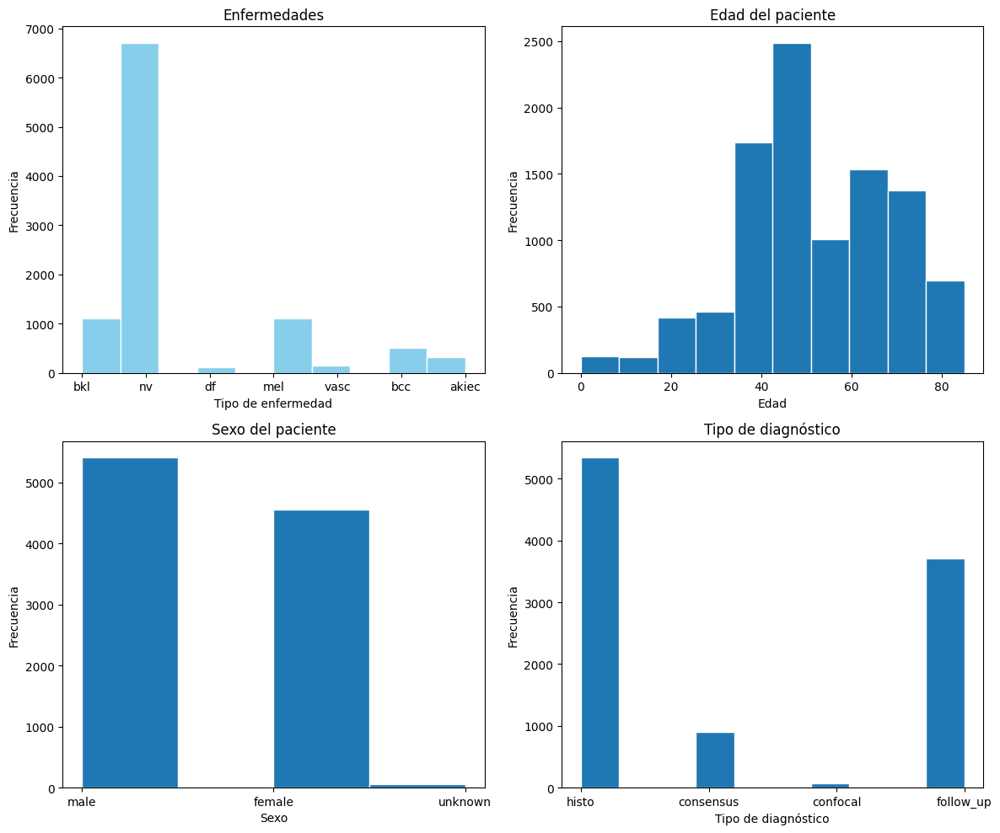

In [ ]:
import matplotlib.pyplot as plt

# Crear una figura con una cuadrícula de 2x2 subgráficos
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Aplanar el array de ejes para facilitar el acceso
axes = axes.flatten()

# Histograma 1: Enfermedades (dx)
axes[0].hist(df['dx'], edgecolor='w',color='skyblue')
axes[0].set_title("Enfermedades")
axes[0].set_xlabel("Tipo de enfermedad")
axes[0].set_ylabel("Frecuencia")

# Histograma 2: Edad (age)
axes[1].hist(df['age'], bins=10, edgecolor='w')
axes[1].set_title("Edad del paciente")
axes[1].set_xlabel("Edad")
axes[1].set_ylabel("Frecuencia")

# Histograma 3: Sexo (sex)
axes[2].hist(df['sex'], bins=4, edgecolor='w')
axes[2].set_title("Sexo del paciente")
axes[2].set_xlabel("Sexo")
axes[2].set_ylabel("Frecuencia")

# Histograma 4: Tipo de diagnóstico (dx_type)
axes[3].hist(df['dx_type'], bins=10, edgecolor='w')
axes[3].set_title("Tipo de diagnóstico")
axes[3].set_xlabel("Tipo de diagnóstico")
axes[3].set_ylabel("Frecuencia")

# Ajustar el diseño para evitar solapamiento
plt.tight_layout()

# Mostrar la figura
plt.show()

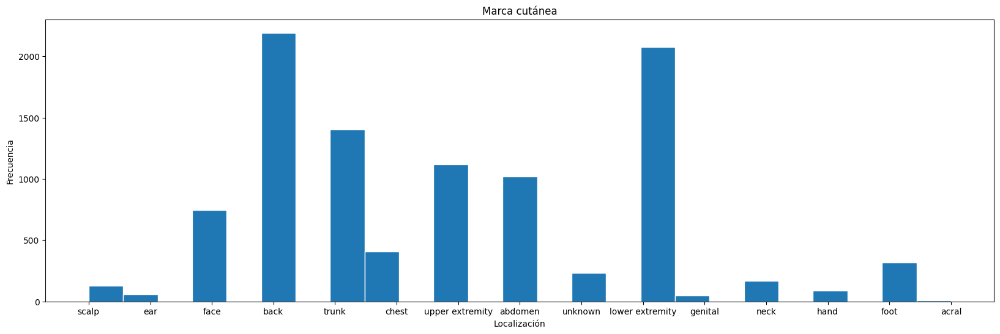

In [ ]:
plt.figure(figsize=(20, 6))
plt.hist(df['localization'], bins= 25, edgecolor='w')
plt.title("Marca cutánea")
plt.xlabel("Localización")
plt.ylabel("Frecuencia")
plt.show()

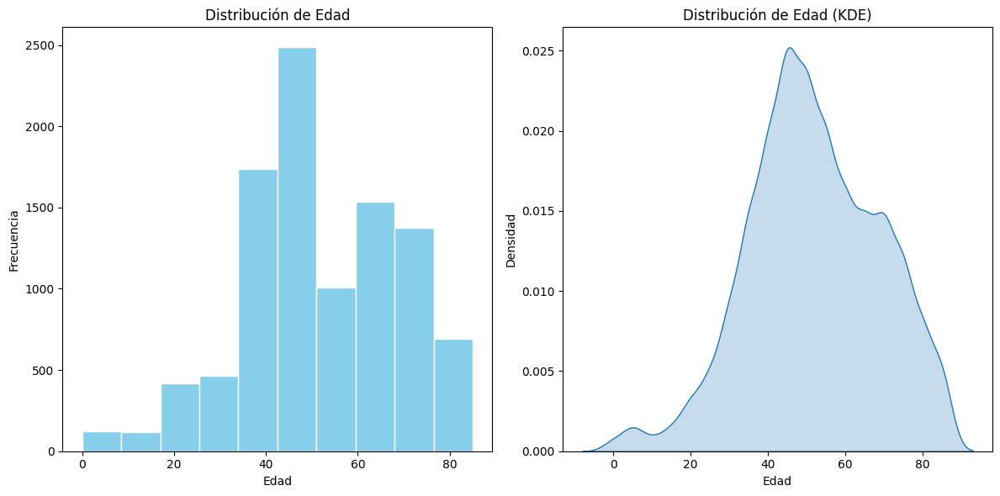

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Crear figura con dos subgráficos (1 fila, 2 columnas)
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Primer gráfico: Histograma de Edad
axes[0].hist(df['age'], edgecolor='w', color='skyblue')
axes[0].set_title("Distribución de Edad")
axes[0].set_xlabel("Edad")
axes[0].set_ylabel("Frecuencia")

# Segundo gráfico: KDE de Edad
sns.kdeplot(data=df, x='age', fill=True, ax=axes[1])
axes[1].set_title("Distribución de Edad (KDE)")
axes[1].set_xlabel("Edad")
axes[1].set_ylabel("Densidad")

# Ajustar diseño
plt.tight_layout()
plt.show()

In [ ]:
df['age'].value_counts()

,count
age,
45.0,1299
50.0,1187
55.0,1009
40.0,985
60.0,803
70.0,756
35.0,753
65.0,731
75.0,618


# Imagenes

In [ ]:
# Cargar el DataFrame
df = pd.read_csv('/content/drive/MyDrive/Cancer/HAM10000_metadata.csv')

# Definir los directorios de las imágenes
img_dir_1 = '/content/drive/MyDrive/Cancer/HAM10000_images_part_1'
img_dir_2 = '/content/drive/MyDrive/Cancer/HAM10000_images_part_2'

# Unir rutas y crear una columna con la ruta completa de la imagen
df["image_path"] = df["image_id"].apply(lambda x: os.path.join(img_dir_1, x + '.jpg')
                                        if os.path.exists(os.path.join(img_dir_1, x + '.jpg'))
                                        else os.path.join(img_dir_2, x + '.jpg'))

# Verificar que todas las imágenes existen
missing_images = df[~df["image_path"].apply(os.path.exists)]
if not missing_images.empty:
    print(f"Advertencia: {len(missing_images)} imágenes no se encontraron.")
    print(missing_images.head())
else:
    print("Todas las imágenes existen.")



Todas las imágenes existen.


In [ ]:
df_all = pd.read_csv('/content/drive/MyDrive/Cancer/HAM10000_metadata_with_features.csv')



In [ ]:
df_all.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,entropy,hue_mean,saturation_mean,value_mean,hue_std,saturation_std,value_std,contraste,correlacion,homogeneidad,energia,area_lesion
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,/content/drive/MyDrive/Cancer/HAM10000_images_...,4.264036,149.605474,58.098915,208.937448,46.893929,18.862576,12.194338,62.236288,0.906082,0.182026,0.027880,96576
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,/content/drive/MyDrive/Cancer/HAM10000_images_...,4.714361,151.438567,55.551526,197.535278,39.811397,18.342294,35.876503,81.077782,0.964935,0.153683,0.021017,31596
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,/content/drive/MyDrive/Cancer/HAM10000_images_...,4.207720,158.419381,69.424844,214.064948,41.889525,14.554734,13.769318,64.766245,0.881337,0.171108,0.027542,122827
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,/content/drive/MyDrive/Cancer/HAM10000_images_...,4.690451,152.929437,71.163889,195.770748,50.620672,17.291983,37.903879,164.137905,0.923238,0.123978,0.019107,28723
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,/content/drive/MyDrive/Cancer/HAM10000_images_...,5.013511,149.557719,56.410537,211.779207,47.360541,25.598358,33.524918,121.415317,0.961981,0.194121,0.019071,129503


# Imputacion con KNN para edad.

In [ ]:
from sklearn.impute import KNNImputer
df_all['age'] = df_all['age'].replace(0, np.nan)
imputer = KNNImputer(n_neighbors=5)
df_all['age'] = imputer.fit_transform(df_all[['age']])[:,0]



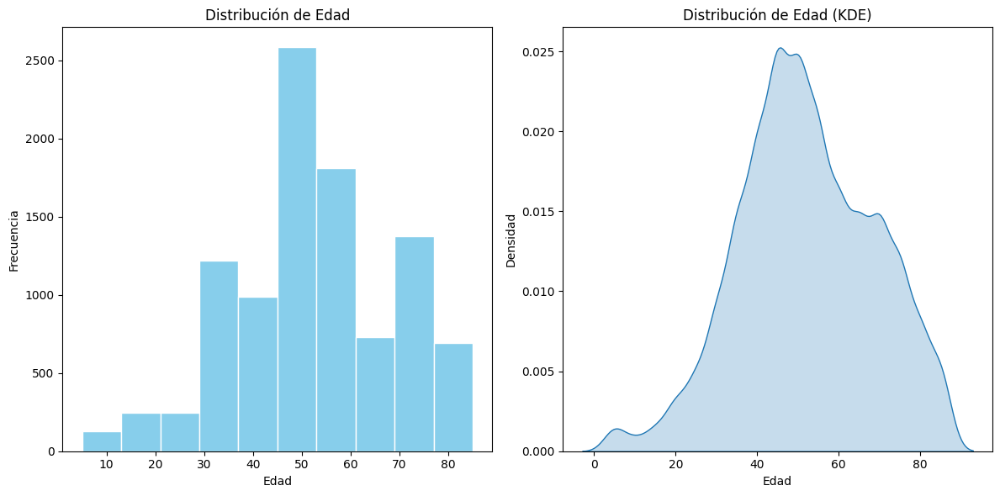

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Crear figura con dos subgráficos (1 fila, 2 columnas)
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Primer gráfico: Histograma de Edad
axes[0].hist(df_all['age'], edgecolor='w', color='skyblue')
axes[0].set_title("Distribución de Edad")
axes[0].set_xlabel("Edad")
axes[0].set_ylabel("Frecuencia")

# Segundo gráfico: KDE de Edad
sns.kdeplot(data=df_all, x='age', fill=True, ax=axes[1])
axes[1].set_title("Distribución de Edad (KDE)")
axes[1].set_xlabel("Edad")
axes[1].set_ylabel("Densidad")

# Ajustar diseño
plt.tight_layout()
plt.show()

In [ ]:
df_all.shape

(10015, 20)

In [ ]:
x = []
for i in df_all["age"]:
  if i==0:
    x.append(i)
print(len(x))

0


In [ ]:
(df_all["age"]==0).sum()

np.int64(0)

In [ ]:
df_all["dx"]=df_all["dx"].map({"nv":0,"mel":1,"bkl":2,"bcc":3,"akiec":4,"vasc":5,"df":6})


In [ ]:
df_all.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,image_path,entropy,hue_mean,saturation_mean,value_mean,hue_std,saturation_std,value_std,contraste,correlacion,homogeneidad,energia,area_lesion
0,HAM_0000118,ISIC_0027419,2,histo,80.0,male,scalp,/content/drive/MyDrive/Cancer/HAM10000_images_...,4.264036,149.605474,58.098915,208.937448,46.893929,18.862576,12.194338,62.236288,0.906082,0.182026,0.027880,96576
1,HAM_0000118,ISIC_0025030,2,histo,80.0,male,scalp,/content/drive/MyDrive/Cancer/HAM10000_images_...,4.714361,151.438567,55.551526,197.535278,39.811397,18.342294,35.876503,81.077782,0.964935,0.153683,0.021017,31596
2,HAM_0002730,ISIC_0026769,2,histo,80.0,male,scalp,/content/drive/MyDrive/Cancer/HAM10000_images_...,4.207720,158.419381,69.424844,214.064948,41.889525,14.554734,13.769318,64.766245,0.881337,0.171108,0.027542,122827
3,HAM_0002730,ISIC_0025661,2,histo,80.0,male,scalp,/content/drive/MyDrive/Cancer/HAM10000_images_...,4.690451,152.929437,71.163889,195.770748,50.620672,17.291983,37.903879,164.137905,0.923238,0.123978,0.019107,28723
4,HAM_0001466,ISIC_0031633,2,histo,75.0,male,ear,/content/drive/MyDrive/Cancer/HAM10000_images_...,5.013511,149.557719,56.410537,211.779207,47.360541,25.598358,33.524918,121.415317,0.961981,0.194121,0.019071,129503


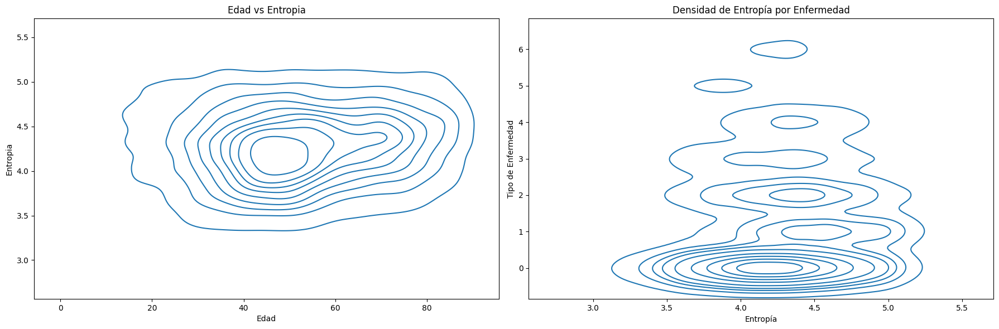

In [ ]:
# Crear figura con dos subgráficos
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
# Primer gráfico: Edad vs Energía (con colores vistosos)
sns.kdeplot(data=df_all, x='age', y='entropy', ax=axes[0])
axes[0].set_xlabel("Edad")
axes[0].set_ylabel("Entropia")
axes[0].set_title("Edad vs Entropia")

# Tercer gráfico: KDE 2D de Entropía vs Tipo de Enfermedad
sns.kdeplot(data=df_all, x='entropy', y='dx', ax=axes[1])
axes[1].set_xlabel("Entropía")
axes[1].set_ylabel("Tipo de Enfermedad")
axes[1].set_title("Densidad de Entropía por Enfermedad")



# Ajustar diseño
plt.tight_layout()
plt.show()

* nv:0
* mel:1 Maligna
* bkl:2
* bcc:3 Maligna
* akiec:4 Maligna
* vasc:5
* df:6

<Axes: xlabel='age', ylabel='entropy'>

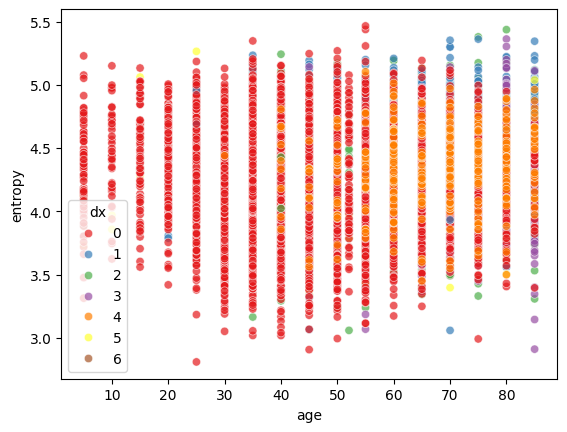

In [ ]:
sns.scatterplot(data=df_all, x='age', y='entropy', hue='dx', palette='Set1', alpha=0.7)

In [ ]:
# Seleccionar solo las columnas desde "entropy" hasta "area_lesion"
columnas_interes = df_all.loc[:, "entropy":"area_lesion"].columns  # Selecciona todas en ese rango

# Calcular la correlación de "age" con cada una de estas columnas
for col in columnas_interes:
    correlacion = df_all["age"].corr(df_all[col], method="pearson")
    print(f"Correlación entre 'age' y '{col}': {correlacion:.4f}")

Correlación entre 'age' y 'entropy': 0.0875
Correlación entre 'age' y 'hue_mean': 0.0441
Correlación entre 'age' y 'saturation_mean': -0.0648
Correlación entre 'age' y 'value_mean': -0.0878
Correlación entre 'age' y 'hue_std': 0.0285
Correlación entre 'age' y 'saturation_std': -0.0583
Correlación entre 'age' y 'value_std': -0.0862
Correlación entre 'age' y 'contraste': 0.0564
Correlación entre 'age' y 'correlacion': -0.1360
Correlación entre 'age' y 'homogeneidad': -0.1457
Correlación entre 'age' y 'energia': -0.1687
Correlación entre 'age' y 'area_lesion': 0.1206


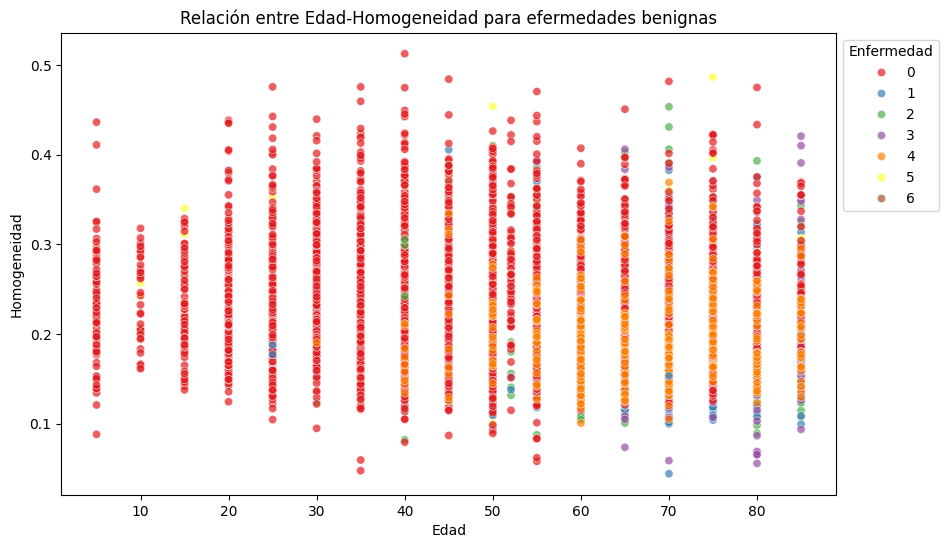

In [ ]:


# Crear el scatter plot
plt.figure(figsize=(10,6))
sns.scatterplot(data=df_all, x='age', y='homogeneidad', hue='dx', palette='Set1', alpha=0.7)

# Etiquetas y título
plt.xlabel("Edad")
plt.ylabel("Homogeneidad")
plt.title("Relación entre Edad-Homogeneidad para efermedades benignas")
plt.legend(title="Enfermedad", bbox_to_anchor=(1, 1))  # Mover leyenda fuera del gráfico
plt.show()

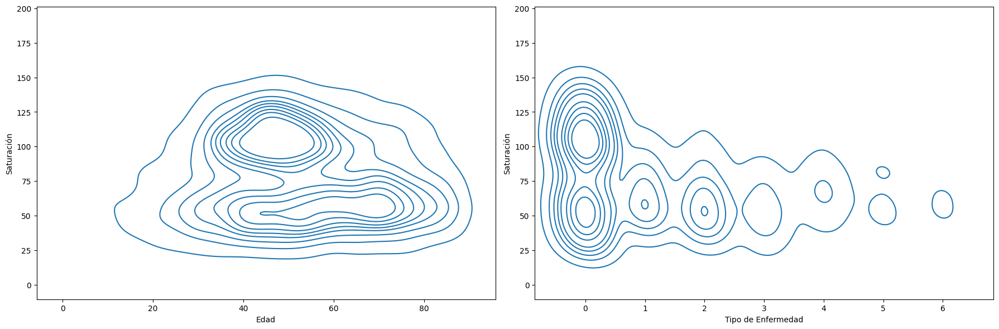

In [ ]:
# Crear figura con dos subgráficos
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
# Primer gráfico: Edad vs Energía (con colores vistosos)
sns.kdeplot(data=df_all, x='age', y='saturation_mean', ax=axes[0])
axes[0].set_xlabel("Edad")
axes[0].set_ylabel("Saturación")
#axes[0].set_title("Edad vs Saturación")

# Tercer gráfico: KDE 2D de Entropía vs Tipo de Enfermedad
sns.kdeplot(data=df_all, x='dx', y='saturation_mean', ax=axes[1])
axes[1].set_xlabel("Tipo de Enfermedad")
axes[1].set_ylabel("Saturación")
#axes[1].set_title("Densidad de Entropía por Enfermedad")



# Ajustar diseño
plt.tight_layout()
plt.show()

# Box plot para determinar la gravedad

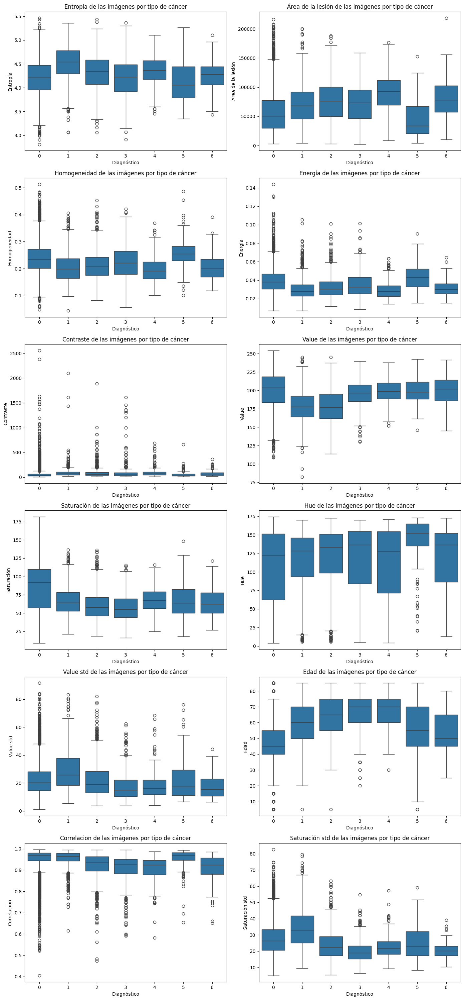

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Variables que querés graficar
variables = [
    ('entropy', 'Entropía'),
    ('area_lesion', 'Área de la lesión'),
    ('homogeneidad', 'Homogeneidad'),
    ('energia', 'Energía'),
    ('contraste', 'Contraste'),
    ('value_mean', 'Value'),
    ('saturation_mean', 'Saturación'),
    ('hue_mean', 'Hue'),
    ('value_std', 'Value std'),
    ('age', 'Edad'),
    ('correlacion','Correlacion'),
    ('saturation_std','Saturación std')
]

# Crear figura con 5 filas y 2 columnas (10 gráficos)
fig, axes = plt.subplots(6, 2, figsize=(14, 30))
axes = axes.flatten()  # convertir a lista plana para indexar fácilmente

# Crear los boxplots
for i, (col, titulo) in enumerate(variables):
    sns.boxplot(x='dx', y=col, data=df_all, ax=axes[i])
    axes[i].set_xlabel("Diagnóstico")
    axes[i].set_ylabel(titulo)
    axes[i].set_title(f"{titulo} de las imágenes por tipo de cáncer")

# Ajustar diseño
plt.tight_layout()
plt.show()


# Clasificación

* nv (nevus, probablemente benigno): ~6700 casos (muy dominante).
* bkl (queratosis benigna): ~1100 casos.
* mel (melanoma): ~1100 casos.
* bcc (carcinoma basocelular): ~500 casos.
* akiec (queratosis actínica): ~300 casos.
* vasc (lesión vascular): ~150 casos.
* df (dermatofibroma): ~100 casos.

### XGboost

Modelos sin interaccioens (Mejor modelo)

Mejores hiperparámetros (XGBoost): {'colsample_bytree': 1.0, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 200, 'subsample': 0.8}
Reporte de clasificación (mejor modelo XGBoost):
              precision    recall  f1-score   support

          nv       0.90      0.86      0.88      1341
         mel       0.41      0.75      0.53       223
         bkl       0.56      0.23      0.33       220
         bcc       0.39      0.50      0.43       103
       akiec       0.44      0.58      0.50        65
        vasc       0.60      0.11      0.18        28
          df       0.33      0.04      0.08        23

    accuracy                           0.73      2003
   macro avg       0.52      0.44      0.42      2003
weighted avg       0.76      0.73      0.72      2003

Recall para mel, bcc, akiec: 0.66
Recall para nv: 0.86
Recall para mel: 0.75
Recall para bkl: 0.23
Recall para bcc: 0.50
Recall para akiec: 0.58
Recall para vasc: 0.11
Recall para df: 0.04


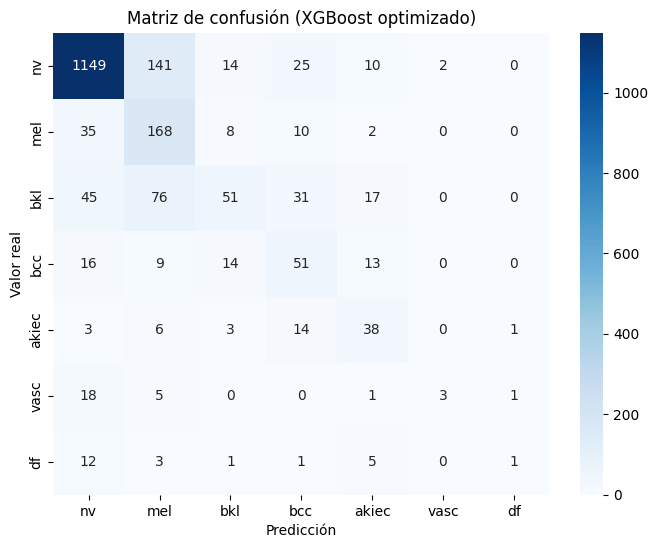

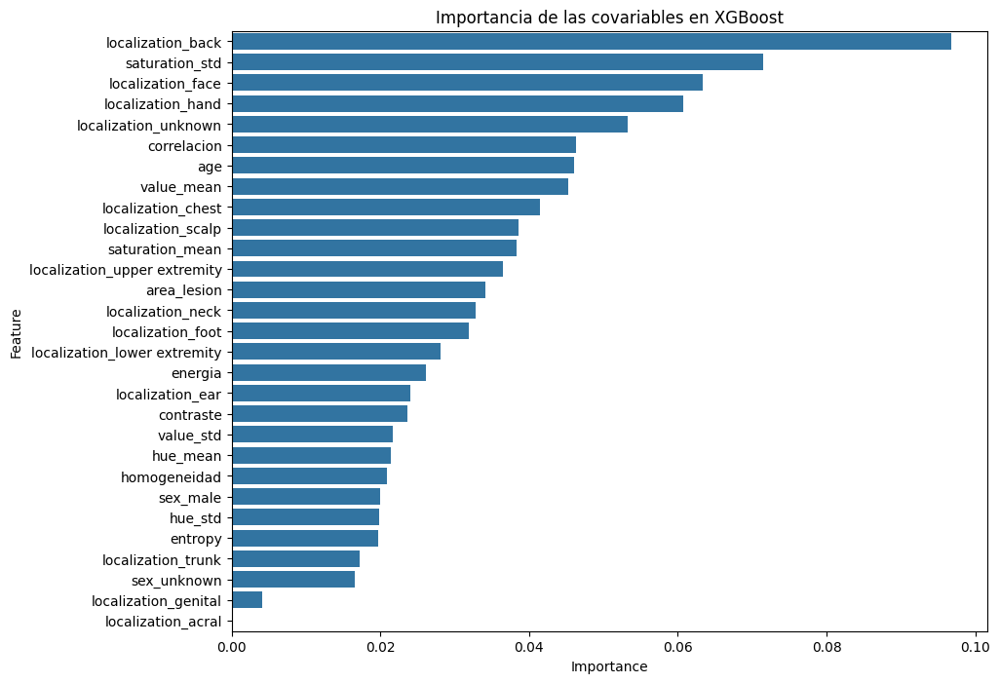


Importancia de las covariables (XGBoost):
                         Feature  Importance
16             localization_back    0.096715
7                 saturation_std    0.071522
19             localization_face    0.063390
22             localization_hand    0.060712
27          localization_unknown    0.053246
10                   correlacion    0.046296
0                            age    0.046006
5                     value_mean    0.045235
17            localization_chest    0.041476
25            localization_scalp    0.038555
4                saturation_mean    0.038373
28  localization_upper extremity    0.036442
12                   area_lesion    0.034136
24             localization_neck    0.032808
20             localization_foot    0.031927
23  localization_lower extremity    0.028151
11                       energia    0.026161
18              localization_ear    0.023976
9                      contraste    0.023629
8                      value_std    0.021651
3           

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, recall_score, make_scorer
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from scipy.stats.mstats import winsorize

# Seleccionar las covariables
covariables = [
    'age', 'sex', 'entropy', 'homogeneidad',
    'hue_mean', 'saturation_mean', 'value_mean', 'hue_std', 'saturation_std', 'value_std',
    'contraste', 'correlacion', 'energia',
    'area_lesion',
    'localization'
]

# Datos
X = df_all[covariables].copy()
y = df_all['dx'].copy()
X.loc[:, 'age'] = X['age'].fillna(X['age'].median())
X.loc[:, 'area_lesion'] = winsorize(X['area_lesion'], limits=[0.05, 0.05])
X.loc[:, 'contraste'] = winsorize(X['contraste'], limits=[0.05, 0.05])
X = pd.get_dummies(X, columns=['sex', 'localization'], drop_first=True)
X = X.dropna()
y = y.loc[X.index]

# Definir los nombres de las clases
class_names = ['nv', 'mel', 'bkl', 'bcc', 'akiec', 'vasc', 'df']

# División
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# SMOTE focalizado para clases malignas
smote = SMOTE(sampling_strategy={1: 2000, 3: 1000, 4: 800}, random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Pesos de clase
class_weights = {0: 1, 1: 8, 2: 1, 3: 12, 4: 18, 5: 3, 6: 3}
sample_weights = np.array([class_weights[y] for y in y_train_resampled])

# Definir métrica personalizada para GridSearchCV
def custom_recall_score(y_true, y_pred):
    return recall_score(y_true, y_pred, labels=[1, 3, 4], average='micro')  # mel, bcc, akiec
custom_scorer = make_scorer(custom_recall_score)

# Búsqueda de hiperparámetros
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 6, 10],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 1]
}
xgb_model = XGBClassifier(random_state=42, eval_metric='mlogloss')
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring=custom_scorer, n_jobs=-1)
grid_search.fit(X_train_resampled, y_train_resampled, sample_weight=sample_weights)

# Mejor modelo
print("Mejores hiperparámetros (XGBoost):", grid_search.best_params_)
best_xgb = grid_search.best_estimator_

# Predicciones y evaluación
y_pred = best_xgb.predict(X_test)
print("Reporte de clasificación (mejor modelo XGBoost):")
print(classification_report(y_test, y_pred, target_names=class_names))

# Recall específico para clases malignas
recall_malignas = recall_score(y_test, y_pred, labels=[1, 3, 4], average='micro')
print(f"Recall para mel, bcc, akiec: {recall_malignas:.2f}")

# Recall por clase
recall_per_class = recall_score(y_test, y_pred, average=None, labels=np.unique(y))
for i, label in enumerate(class_names):
    print(f"Recall para {label}: {recall_per_class[i]:.2f}")

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title("Matriz de confusión (XGBoost optimizado)")
plt.xlabel("Predicción")
plt.ylabel("Valor real")
plt.show()

# Importancia de las covariables
importances = best_xgb.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Graficar importancia
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title("Importancia de las covariables en XGBoost")
plt.show()
print("\nImportancia de las covariables (XGBoost):")
print(feature_importance_df)

In [ ]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   lesion_id        10015 non-null  object 
 1   image_id         10015 non-null  object 
 2   dx               10015 non-null  int64  
 3   dx_type          10015 non-null  object 
 4   age              10015 non-null  float64
 5   sex              10015 non-null  object 
 6   localization     10015 non-null  object 
 7   image_path       10015 non-null  object 
 8   entropy          10015 non-null  float64
 9   hue_mean         10015 non-null  float64
 10  saturation_mean  10015 non-null  float64
 11  value_mean       10015 non-null  float64
 12  hue_std          10015 non-null  float64
 13  saturation_std   10015 non-null  float64
 14  value_std        10015 non-null  float64
 15  contraste        10015 non-null  float64
 16  correlacion      10015 non-null  float64
 17  homogeneidad

In [ ]:
# Opcional: asignar etiquetas de gravedad
cluster_means = df_all.groupby('gravedad_cluster')['area_lesion'].mean().sort_values()
map_gravedad = {cluster: idx for idx, cluster in enumerate(cluster_means.index)}
df_all['gravedad_cluster'] = df_all['gravedad_cluster'].map(map_gravedad)

In [ ]:
df_all['gravedad_cluster']

,gravedad_cluster
0,1
1,1
2,1
3,1
4,2
...,...
10010,1
10011,2
10012,1
10013,1


# GRavedad

Distribución de dx por cluster:
dx                   0    1    2    3    4   5   6
gravedad_cluster                                  
0.0               1656  519  209   40   32  23  11
1.0               1861  443  683  338  271  36  82
2.0               3188  151  207  136   24  83  22

Proporción de gravedad por cluster:
gravedad_dx          grave      leve  moderado
gravedad_cluster                              
0.0               0.237349  0.665060  0.097590
1.0               0.283253  0.501077  0.215670
2.0               0.081606  0.836526  0.081868


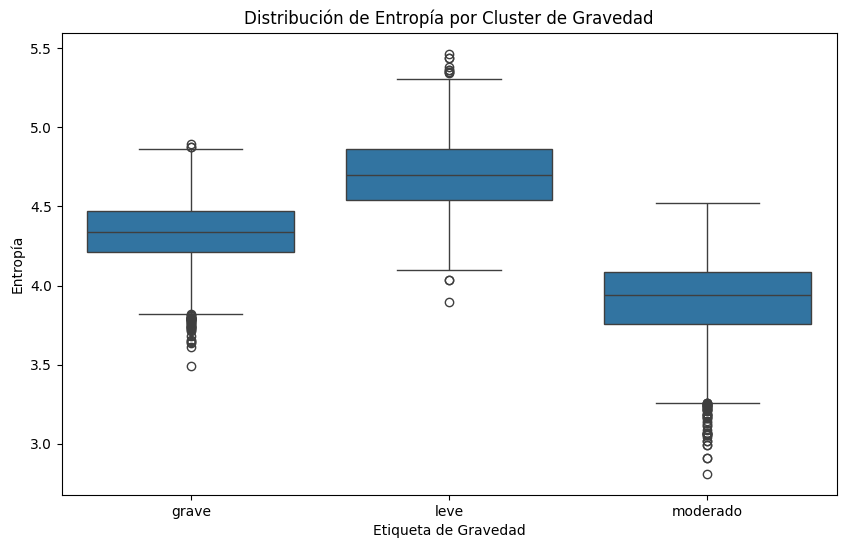

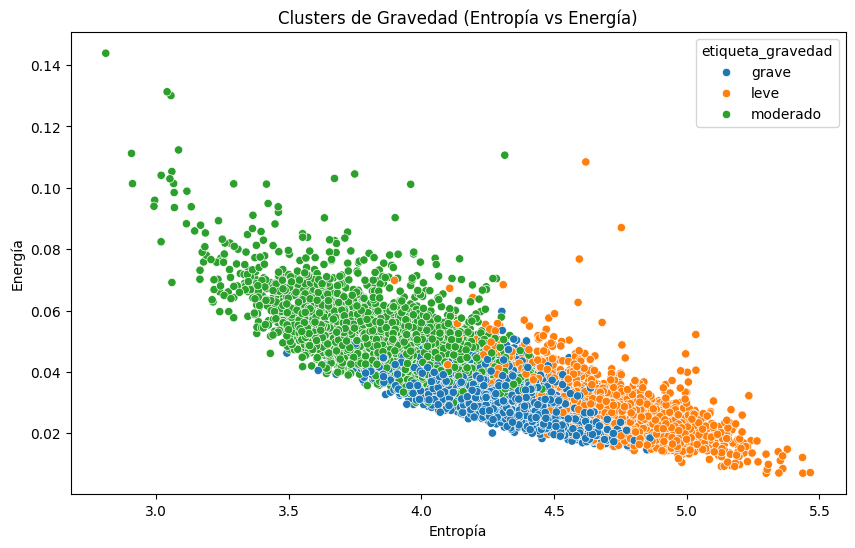


Distribución de dx_pred_xgb por etiqueta_gravedad:
dx_pred_xgb         0.0  1.0  2.0  3.0  4.0  5.0  6.0
etiqueta_gravedad                                    
grave              1670  698  475  417  355   32   67
leve               1505  760  126   42   30   19    8
moderado           3150  228  150  169   26   68   20

Primeras filas de df_all con la nueva etiqueta:
   dx  gravedad_cluster etiqueta_gravedad
0   2               1.0             grave
1   2               1.0             grave
2   2               1.0             grave
3   2               1.0             grave
4   2               0.0              leve


In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# --- Paso 1: Selección de características para clustering ---
features = ['entropy', 'energia', 'saturation_std', 'value_std', 'area_lesion', 'age']

# --- Paso 2: Preparación de los datos ---
# Seleccionar características y eliminar filas con valores faltantes
X = df_all[features].dropna()

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --- Paso 3: Aplicar K-Means con 3 clusters ---
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Añadir los clusters al dataframe original (solo para las filas sin valores faltantes)
df_all.loc[X.index, 'gravedad_cluster'] = clusters

# --- Paso 4: Interpretar los clusters según la gravedad ---
# Mapa de gravedad aproximado basado en dx
gravedad_map = {0: 'leve', 1: 'grave', 2: 'moderado', 3: 'grave', 4: 'grave', 5: 'moderado', 6: 'moderado'}

# Crear una columna temporal con etiquetas de gravedad basadas en dx
df_all.loc[X.index, 'gravedad_dx'] = df_all.loc[X.index, 'dx'].map(gravedad_map)

# Analizar la distribución de dx por cluster
cluster_dx_dist = pd.crosstab(df_all.loc[X.index, 'gravedad_cluster'], df_all.loc[X.index, 'dx'])
print("Distribución de dx por cluster:")
print(cluster_dx_dist)

# Calcular proporción de gravedad por cluster
cluster_gravedad_dist = pd.crosstab(df_all.loc[X.index, 'gravedad_cluster'], df_all.loc[X.index, 'gravedad_dx'], normalize='index')
print("\nProporción de gravedad por cluster:")
print(cluster_gravedad_dist)

# --- Paso 5: Asignar etiquetas de gravedad a los clusters ---
# Ajusta este mapeo según los resultados de cluster_gravedad_dist
cluster_to_gravedad = {0: 'leve', 1: 'grave', 2: 'moderado'}  # Ejemplo, ajusta según tus datos
df_all.loc[X.index, 'etiqueta_gravedad'] = df_all.loc[X.index, 'gravedad_cluster'].map(cluster_to_gravedad)

# --- Paso 6: Visualización ---
# Boxplot de entropy por cluster
plt.figure(figsize=(10, 6))
sns.boxplot(x='etiqueta_gravedad', y='entropy', data=df_all.loc[X.index])
plt.title('Distribución de Entropía por Cluster de Gravedad')
plt.xlabel('Etiqueta de Gravedad')
plt.ylabel('Entropía')
plt.show()

# Scatter plot de entropy vs energia
plt.figure(figsize=(10, 6))
sns.scatterplot(x='entropy', y='energia', hue='etiqueta_gravedad', data=df_all.loc[X.index])
plt.title('Clusters de Gravedad (Entropía vs Energía)')
plt.xlabel('Entropía')
plt.ylabel('Energía')
plt.show()

# --- Paso 7: Validación con XGBoost ---
# Lista completa de columnas que el modelo XGBoost espera (según el error)
covariables_xgb = [
    'age', 'entropy', 'homogeneidad', 'hue_mean', 'saturation_mean', 'value_mean',
    'hue_std', 'saturation_std', 'value_std', 'contraste', 'correlacion', 'energia',
    'area_lesion', 'sex_male', 'sex_unknown', 'localization_acral', 'localization_back',
    'localization_chest', 'localization_ear', 'localization_face', 'localization_foot',
    'localization_genital', 'localization_hand', 'localization_lower extremity',
    'localization_neck', 'localization_scalp', 'localization_trunk', 'localization_unknown',
    'localization_upper extremity'
]

# Preparar datos para XGBoost
X_test_clusters = df_all.loc[X.index].copy()

# Generar columnas dummy para 'sex' y 'localization'
X_test_clusters = pd.get_dummies(X_test_clusters, columns=['sex', 'localization'], drop_first=False)

# Renombrar columnas de 'sex' para que coincidan con el modelo
X_test_clusters = X_test_clusters.rename(columns={
    'sex_male': 'sex_male',
    'sex_unknown': 'sex_unknown'
})

# Renombrar columnas de 'localization' para que coincidan con el modelo
localization_cols = [col for col in X_test_clusters.columns if col.startswith('localization_')]
for col in localization_cols:
    X_test_clusters = X_test_clusters.rename(columns={col: col.replace('localization_', 'localization_')})

# Asegurarse de que todas las columnas esperadas estén presentes
for col in covariables_xgb:
    if col not in X_test_clusters.columns:
        X_test_clusters[col] = 0  # Rellenar con 0 si la columna falta

# Seleccionar solo las columnas que el modelo espera
X_test_clusters = X_test_clusters[covariables_xgb]

# Rellenar valores faltantes con la mediana (si los hay)
X_test_clusters = X_test_clusters.fillna(X_test_clusters.median(numeric_only=True))

# Predecir con XGBoost
y_pred_xgb = best_xgb.predict(X_test_clusters)

# Añadir predicciones al dataframe
df_all.loc[X.index, 'dx_pred_xgb'] = y_pred_xgb

# Comparar predicciones con clusters
print("\nDistribución de dx_pred_xgb por etiqueta_gravedad:")
print(pd.crosstab(df_all.loc[X.index, 'etiqueta_gravedad'], df_all.loc[X.index, 'dx_pred_xgb']))

# --- Resultado final ---
print("\nPrimeras filas de df_all con la nueva etiqueta:")
print(df_all[['dx', 'gravedad_cluster', 'etiqueta_gravedad']].head())


Proporción de gravedad por cluster (para ajustar etiquetas):
gravedad_dx          grave      leve  moderado
gravedad_cluster                              
0                 0.253696  0.633640  0.112665
1                 0.096645  0.805171  0.098184
2                 0.235749  0.587145  0.177105


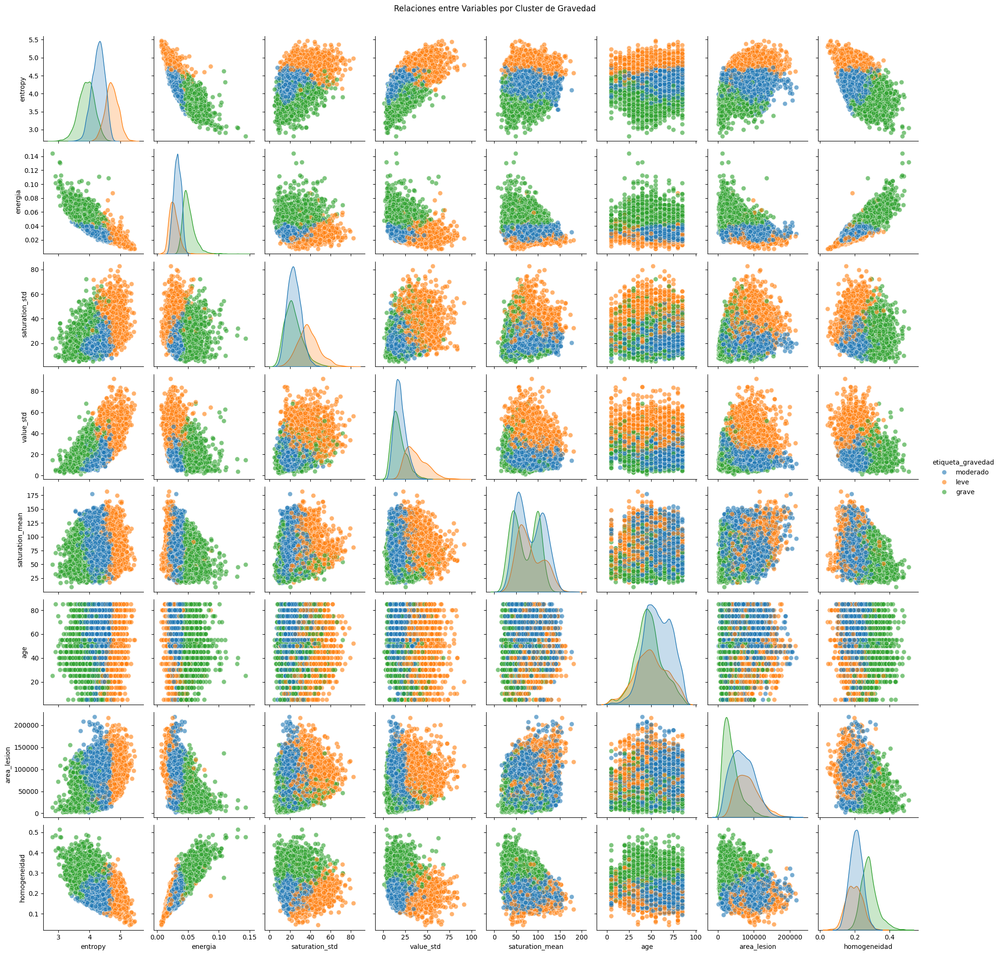


Estadísticas descriptivas por cluster de gravedad:
                    entropy             energia           saturation_std  \
                       mean       std      mean       std           mean   
etiqueta_gravedad                                                          
grave              3.898319  0.260626  0.051182  0.010487      23.493216   
leve               4.718111  0.210736  0.026989  0.007639      38.197261   
moderado           4.276815  0.205164  0.032508  0.005985      23.977679   

                              value_std            saturation_mean             \
                         std       mean        std            mean        std   
etiqueta_gravedad                                                               
grave               8.852802  17.517097   8.319030       69.887406  28.528225   
leve               10.619437  37.060918  12.348963       81.633570  28.973732   
moderado            6.609699  18.962775   6.664409       82.434086  30.498377   

    

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Asumiendo que ya tienes df_all y X del código anterior
# Si no, ejecuta primero el código anterior hasta el Paso 5

# --- Variables de interés ---
variables = [
    'entropy', 'energia', 'saturation_std', 'value_std',
    'saturation_mean', 'age', 'area_lesion', 'homogeneidad'
]

# Asegurarse de que todas las variables estén en X
X = df_all[variables].dropna()

# Si no has corrido el clustering aún, hazlo aquí
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)
df_all.loc[X.index, 'gravedad_cluster'] = clusters

# Mapa de gravedad (ajusta según tus resultados previos)
gravedad_map = {0: 'leve', 1: 'grave', 2: 'moderado', 3: 'grave', 4: 'grave', 5: 'moderado', 6: 'moderado'}
df_all.loc[X.index, 'gravedad_dx'] = df_all.loc[X.index, 'dx'].map(gravedad_map)
cluster_gravedad_dist = pd.crosstab(df_all.loc[X.index, 'gravedad_cluster'], df_all.loc[X.index, 'gravedad_dx'], normalize='index')
print("\nProporción de gravedad por cluster (para ajustar etiquetas):")
print(cluster_gravedad_dist)

# Asignar etiquetas de gravedad (ajusta según cluster_gravedad_dist)
cluster_to_gravedad = {0: 'leve', 1: 'grave', 2: 'moderado'}  # Ejemplo, cámbialo según tus datos
df_all.loc[X.index, 'etiqueta_gravedad'] = df_all.loc[X.index, 'gravedad_cluster'].map(cluster_to_gravedad)

# --- Gráfico de dispersión para todas las variables ---
# Usar pairplot para visualizar todas las combinaciones
sns.pairplot(
    df_all.loc[X.index],
    vars=variables,
    hue='etiqueta_gravedad',
    diag_kind='kde',  # Densidad en la diagonal
    plot_kws={'alpha': 0.6, 's': 50}  # Ajustar transparencia y tamaño de puntos
)

plt.suptitle('Relaciones entre Variables por Cluster de Gravedad', y=1.02)
plt.show()

# --- Opcional: Resumen estadístico por cluster ---
print("\nEstadísticas descriptivas por cluster de gravedad:")
stats_by_cluster = df_all.loc[X.index].groupby('etiqueta_gravedad')[variables].agg(['mean', 'std'])
print(stats_by_cluster)

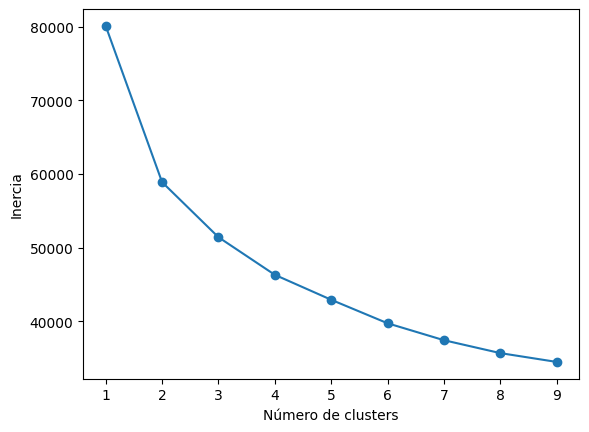

In [ ]:
inertias = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)
plt.plot(range(1, 10), inertias, marker='o')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')
plt.show()

Distribución de dx por cluster:
dx                   0    1    2    3    4   5   6
gravedad_cluster                                  
0                 1656  519  209   40   32  23  11
1                 1861  443  683  338  271  36  82
2                 3188  151  207  136   24  83  22

Proporción de gravedad por cluster:
gravedad_dx          grave      leve  moderado
gravedad_cluster                              
0                 0.237349  0.665060  0.097590
1                 0.283253  0.501077  0.215670
2                 0.081606  0.836526  0.081868


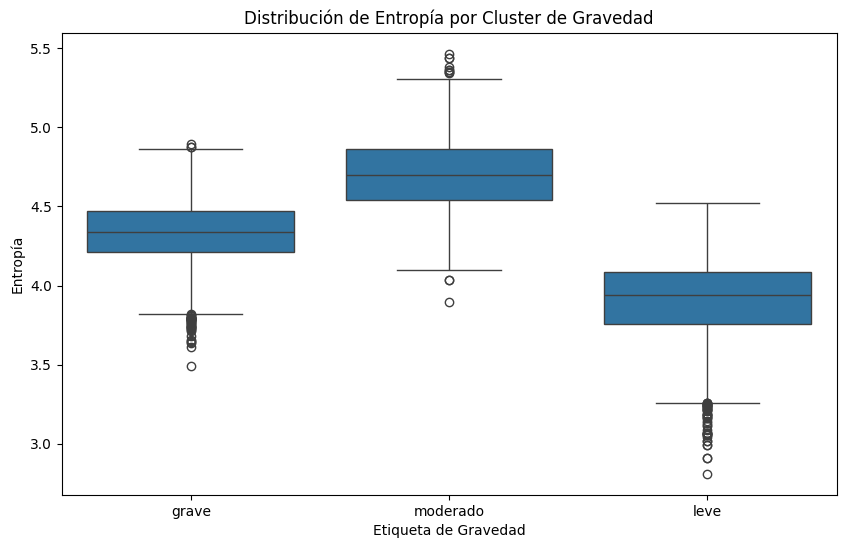

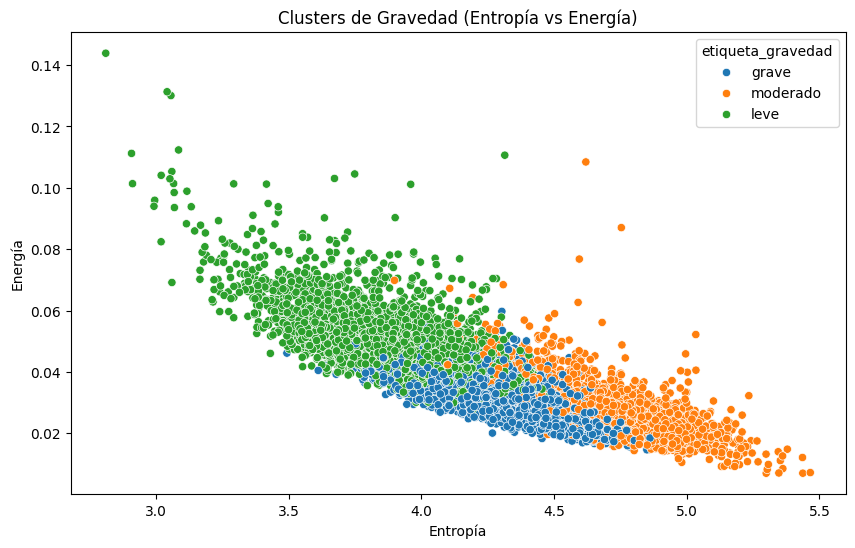


Distribución de dx_pred_xgb por etiqueta_gravedad (etiquetas corregidas):
dx_pred_xgb         0.0  1.0  2.0  3.0  4.0  5.0  6.0
etiqueta_gravedad                                    
grave              1670  698  475  417  355   32   67
leve               3150  228  150  169   26   68   20
moderado           1505  760  126   42   30   19    8

Estadísticas descriptivas por cluster de gravedad (etiquetas corregidas):
                    entropy             energia           saturation_std  \
                       mean       std      mean       std           mean   
etiqueta_gravedad                                                          
grave              4.334431  0.200826  0.031295  0.006409      24.266932   
leve               3.912459  0.242227  0.048787  0.011101      23.064963   
moderado           4.698263  0.228711  0.028220  0.008550      38.604856   

                              value_std                   age             \
                         std       mean        

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# --- Paso 1: Selección de características para clustering ---
features = ['entropy', 'energia', 'saturation_std', 'value_std', 'area_lesion', 'age']

# --- Paso 2: Preparación de los datos ---
# Seleccionar características y eliminar filas con valores faltantes
X = df_all[features].dropna()

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --- Paso 3: Aplicar K-Means con 3 clusters ---
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Añadir los clusters al dataframe original (solo para las filas sin valores faltantes)
df_all.loc[X.index, 'gravedad_cluster'] = clusters

# --- Paso 4: Interpretar los clusters según la gravedad ---
# Mapa de gravedad aproximado basado en dx
gravedad_map = {0: 'leve', 1: 'grave', 2: 'moderado', 3: 'grave', 4: 'grave', 5: 'moderado', 6: 'moderado'}

# Crear una columna temporal con etiquetas de gravedad basadas en dx
df_all.loc[X.index, 'gravedad_dx'] = df_all.loc[X.index, 'dx'].map(gravedad_map)

# Analizar la distribución de dx por cluster
cluster_dx_dist = pd.crosstab(df_all.loc[X.index, 'gravedad_cluster'], df_all.loc[X.index, 'dx'])
print("Distribución de dx por cluster:")
print(cluster_dx_dist)

# Calcular proporción de gravedad por cluster
cluster_gravedad_dist = pd.crosstab(df_all.loc[X.index, 'gravedad_cluster'], df_all.loc[X.index, 'gravedad_dx'], normalize='index')
print("\nProporción de gravedad por cluster:")
print(cluster_gravedad_dist)

# --- Paso 5: Asignar etiquetas de gravedad a los clusters ---
# Ajustado según los resultados de cluster_gravedad_dist:
# Cluster 0: 66.5% leve, 23.7% grave -> "moderado"
# Cluster 1: 50.1% leve, 28.3% grave -> "grave"
# Cluster 2: 83.7% leve, 8.2% grave -> "leve"
cluster_to_gravedad = {0: 'moderado', 1: 'grave', 2: 'leve'}
df_all.loc[X.index, 'etiqueta_gravedad'] = df_all.loc[X.index, 'gravedad_cluster'].map(cluster_to_gravedad)

# --- Paso 6: Visualización ---
# Boxplot de entropy por cluster
plt.figure(figsize=(10, 6))
sns.boxplot(x='etiqueta_gravedad', y='entropy', data=df_all.loc[X.index])
plt.title('Distribución de Entropía por Cluster de Gravedad')
plt.xlabel('Etiqueta de Gravedad')
plt.ylabel('Entropía')
plt.show()

# Scatter plot de entropy vs energia
plt.figure(figsize=(10, 6))
sns.scatterplot(x='entropy', y='energia', hue='etiqueta_gravedad', data=df_all.loc[X.index])
plt.title('Clusters de Gravedad (Entropía vs Energía)')
plt.xlabel('Entropía')
plt.ylabel('Energía')
plt.show()

# --- Paso 7: Validación con XGBoost ---
# Lista completa de columnas que el modelo XGBoost espera
covariables_xgb = [
    'age', 'entropy', 'homogeneidad', 'hue_mean', 'saturation_mean', 'value_mean',
    'hue_std', 'saturation_std', 'value_std', 'contraste', 'correlacion', 'energia',
    'area_lesion', 'sex_male', 'sex_unknown', 'localization_acral', 'localization_back',
    'localization_chest', 'localization_ear', 'localization_face', 'localization_foot',
    'localization_genital', 'localization_hand', 'localization_lower extremity',
    'localization_neck', 'localization_scalp', 'localization_trunk', 'localization_unknown',
    'localization_upper extremity'
]

# Preparar datos para XGBoost
X_test_clusters = df_all.loc[X.index].copy()

# Generar columnas dummy para 'sex' y 'localization'
X_test_clusters = pd.get_dummies(X_test_clusters, columns=['sex', 'localization'], drop_first=False)

# Renombrar columnas de 'sex' para que coincidan con el modelo
X_test_clusters = X_test_clusters.rename(columns={
    'sex_male': 'sex_male',
    'sex_unknown': 'sex_unknown'
})

# Renombrar columnas de 'localization' para que coincidan con el modelo
localization_cols = [col for col in X_test_clusters.columns if col.startswith('localization_')]
for col in localization_cols:
    X_test_clusters = X_test_clusters.rename(columns={col: col.replace('localization_', 'localization_')})

# Asegurarse de que todas las columnas esperadas estén presentes
for col in covariables_xgb:
    if col not in X_test_clusters.columns:
        X_test_clusters[col] = 0  # Rellenar con 0 si la columna falta

# Seleccionar solo las columnas que el modelo espera
X_test_clusters = X_test_clusters[covariables_xgb]

# Rellenar valores faltantes con la mediana (si los hay)
X_test_clusters = X_test_clusters.fillna(X_test_clusters.median(numeric_only=True))

# Predecir con XGBoost
y_pred_xgb = best_xgb.predict(X_test_clusters)

# Añadir predicciones al dataframe
df_all.loc[X.index, 'dx_pred_xgb'] = y_pred_xgb

# Comparar predicciones con clusters
print("\nDistribución de dx_pred_xgb por etiqueta_gravedad (etiquetas corregidas):")
print(pd.crosstab(df_all.loc[X.index, 'etiqueta_gravedad'], df_all.loc[X.index, 'dx_pred_xgb']))

# --- Paso 8: Estadísticas descriptivas por cluster ---
# Calcular estadísticas para las variables usadas en el clustering
variables_clustering = ['entropy', 'energia', 'saturation_std', 'value_std', 'age', 'area_lesion']
stats_by_cluster = df_all.loc[X.index].groupby('etiqueta_gravedad')[variables_clustering].agg(['mean', 'std'])
print("\nEstadísticas descriptivas por cluster de gravedad (etiquetas corregidas):")
print(stats_by_cluster)

# --- Resultado final ---
print("\nPrimeras filas de df_all con la nueva etiqueta (etiquetas corregidas):")
print(df_all[['dx', 'gravedad_cluster', 'etiqueta_gravedad']].head())

In [ ]:
df_all[['dx', 'gravedad_cluster', 'etiqueta_gravedad']].head(100)

,dx,gravedad_cluster,etiqueta_gravedad
0,2,1,grave
1,2,1,grave
2,2,1,grave
3,2,1,grave
4,2,0,moderado
...,...,...,...
95,2,1,grave
96,2,1,grave
97,2,2,leve
98,2,1,grave


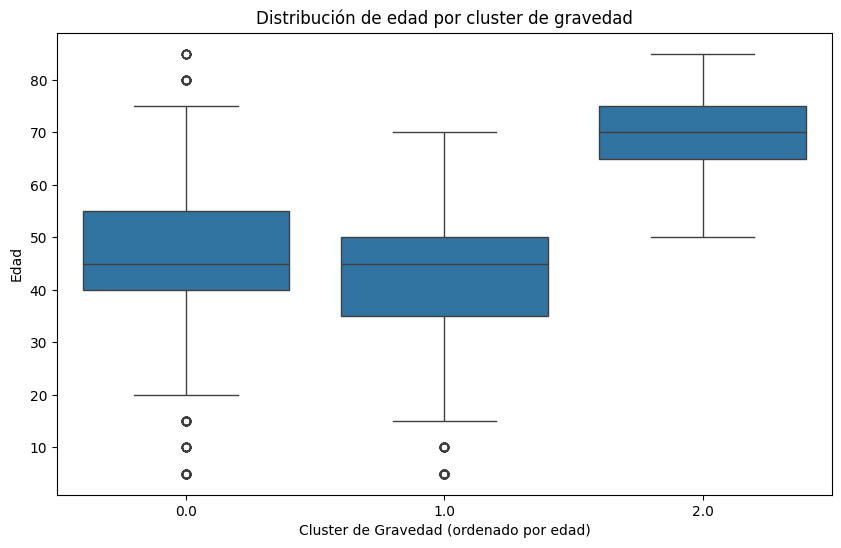

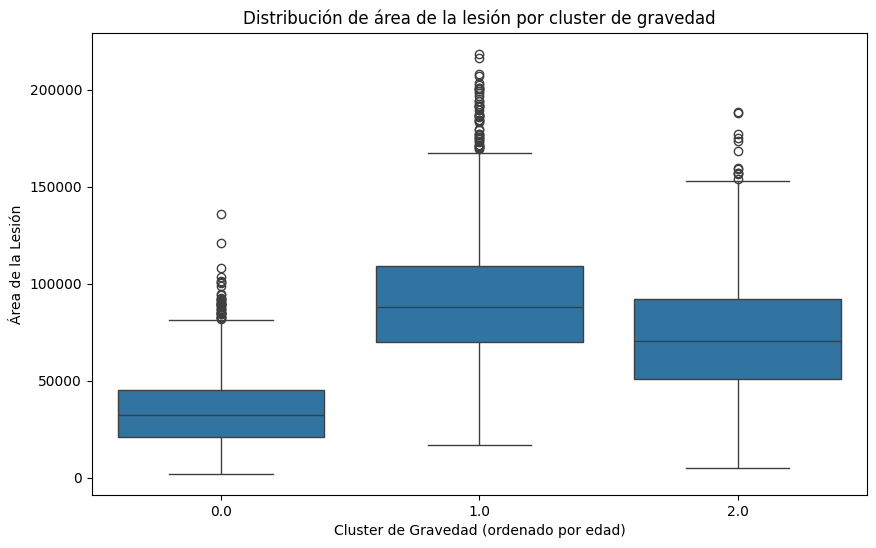

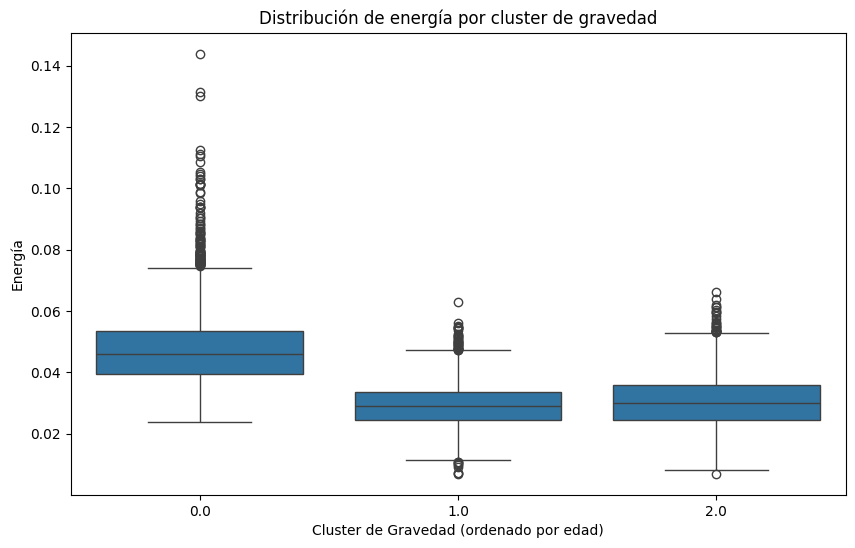

Cantidad de casos por cluster de gravedad (ordenados):
severity_cluster_ordered
0.0    4049
1.0    2808
2.0    3158
Name: count, dtype: int64


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Definir el subconjunto de variables para el clustering.
# Por ejemplo: edad, área de la lesión y energía (estas variables muestran alguna correlación, aunque baja, con la edad)

subset_features = ['age', 'area_lesion', 'energia']

# Seleccionar los datos y remover casos con valores faltantes en estas variables
X_cluster = df_all[subset_features].dropna()

# Escalar los datos para tener medias cero y varianzas unitarias
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# Aplicar KMeans para dividir en 3 clusters (podríamos interpretar 0: leve, 1: moderado, 2: grave)
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Agregar el cluster obtenido a df_all (utilizando el índice de X_cluster)
df_all.loc[X_cluster.index, 'severity_cluster'] = clusters

# Si queremos asignar una interpretación “ordenada” (por ejemplo, basado en la edad promedio de cada cluster),
# ordenamos los clusters por la mediana de 'age'
cluster_order = df_all.groupby('severity_cluster')['age'].median().sort_values().index
# Asignamos un valor ordenado: 0 (menor edad media), 1 y 2 (mayor edad media)
severity_mapping = {cluster: order for order, cluster in enumerate(cluster_order)}
df_all.loc[X_cluster.index, 'severity_cluster_ordered'] = df_all.loc[X_cluster.index, 'severity_cluster'].map(severity_mapping)

# Visualizar la distribución de 'age' por cluster
plt.figure(figsize=(10,6))
sns.boxplot(x='severity_cluster_ordered', y='age', data=df_all.loc[X_cluster.index])
plt.xlabel('Cluster de Gravedad (ordenado por edad)')
plt.ylabel('Edad')
plt.title('Distribución de edad por cluster de gravedad')
plt.show()

# Visualizar la distribución de 'area_lesion' por cluster
plt.figure(figsize=(10,6))
sns.boxplot(x='severity_cluster_ordered', y='area_lesion', data=df_all.loc[X_cluster.index])
plt.xlabel('Cluster de Gravedad (ordenado por edad)')
plt.ylabel('Área de la Lesión')
plt.title('Distribución de área de la lesión por cluster de gravedad')
plt.show()

# Visualizar la distribución de 'energia' por cluster
plt.figure(figsize=(10,6))
sns.boxplot(x='severity_cluster_ordered', y='energia', data=df_all.loc[X_cluster.index])
plt.xlabel('Cluster de Gravedad (ordenado por edad)')
plt.ylabel('Energía')
plt.title('Distribución de energía por cluster de gravedad')
plt.show()

# Mostrar conteos por cada cluster
print("Cantidad de casos por cluster de gravedad (ordenados):")
print(df_all['severity_cluster_ordered'].value_counts().sort_index())


Estadísticas de edad por cluster:
                          min_age  median_age  max_age  count
severity_cluster_ordered                                     
0.0                           5.0        45.0     85.0   4049
1.0                           5.0        45.0     70.0   2808
2.0                          50.0        70.0     85.0   3158


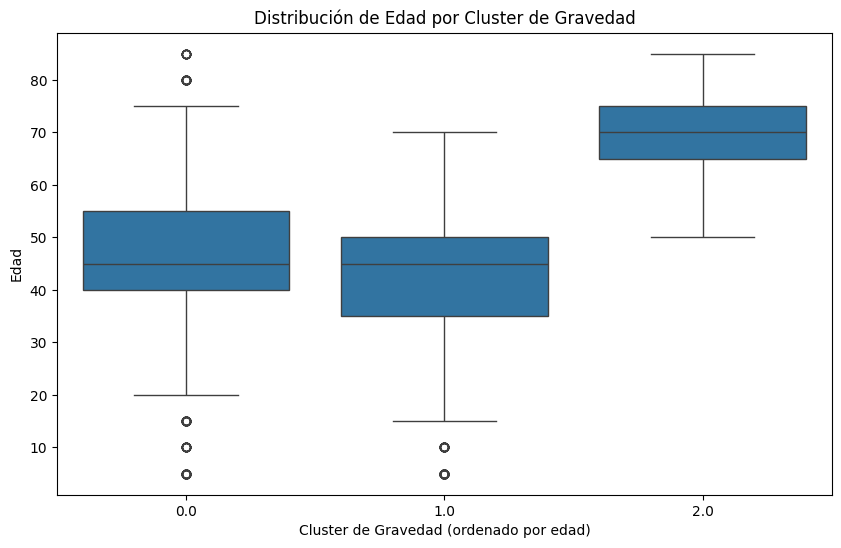

<ipython-input-35-8d039d4a5076>:57: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['age'], label=f'Cluster {int(cluster)}', shade=True)
<ipython-input-35-8d039d4a5076>:57: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['age'], label=f'Cluster {int(cluster)}', shade=True)
<ipython-input-35-8d039d4a5076>:57: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(subset['age'], label=f'Cluster {int(cluster)}', shade=True)


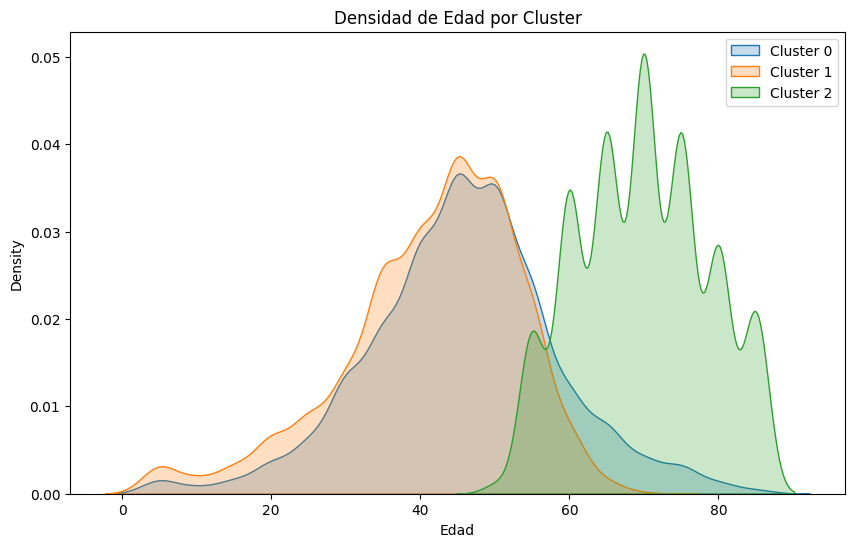

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# --- PREPARACIÓN DE DATOS ---
# Usaremos las variables 'age', 'area_lesion' y 'energia'
subset_features = ['age', 'area_lesion', 'energia']

# Seleccionamos los datos y eliminamos filas con valores faltantes en estas variables
X_cluster = df_all[subset_features].dropna()

# Escalamos las variables para tener media cero y varianza unitaria
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

# --- CLUSTERING CON KMEANS ---
# Aplicamos KMeans para separar en 3 clusters (pueden interpretarse como: leve, moderado, grave)
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Agregamos el resultado del clustering a df_all (solamente en los índices de X_cluster)
df_all.loc[X_cluster.index, 'severity_cluster'] = clusters

# --- ORDENAR LOS CLUSTERS POR LA MEDIANA DE 'age' ---
# Esto nos servirá para interpretar qué cluster agrupa a pacientes de menor o mayor edad.
cluster_order = df_all.groupby('severity_cluster')['age'].median().sort_values().index
severity_mapping = {cluster: order for order, cluster in enumerate(cluster_order)}

# Creamos una nueva columna con los clusters ordenados
df_all.loc[X_cluster.index, 'severity_cluster_ordered'] = df_all.loc[X_cluster.index, 'severity_cluster'].map(severity_mapping)

# --- ESTADÍSTICAS DESCRIPTIVAS POR CLUSTER ---
cluster_stats = df_all.loc[X_cluster.index].groupby('severity_cluster_ordered')['age'].agg(
    min_age='min',
    median_age='median',
    max_age='max',
    count='count'
)
print("Estadísticas de edad por cluster:")
print(cluster_stats)

# --- VISUALIZACIÓN: BOXPLOT DE EDAD POR CLUSTER ---
plt.figure(figsize=(10, 6))
sns.boxplot(x='severity_cluster_ordered', y='age', data=df_all.loc[X_cluster.index])
plt.xlabel('Cluster de Gravedad (ordenado por edad)')
plt.ylabel('Edad')
plt.title('Distribución de Edad por Cluster de Gravedad')
plt.show()

# --- VISUALIZACIÓN: DENSIDAD (KDE) DE EDAD POR CLUSTER ---
plt.figure(figsize=(10, 6))
for cluster in sorted(df_all['severity_cluster_ordered'].dropna().unique()):
    subset = df_all.loc[X_cluster.index][df_all.loc[X_cluster.index, 'severity_cluster_ordered'] == cluster]
    sns.kdeplot(subset['age'], label=f'Cluster {int(cluster)}', shade=True)
plt.xlabel('Edad')
plt.title('Densidad de Edad por Cluster')
plt.legend()
plt.show()


# MEjor código por clusterinsg:

Distribución de dx por cluster:
dx                   0    1    2    3    4   5   6
gravedad_cluster                                  
0                 1586  536  244   55   44  24  14
1                 2616  145  217  144   25  84  18
2                 2503  432  638  315  258  34  83

Proporción de gravedad por cluster:
gravedad_dx          grave      leve  moderado
gravedad_cluster                              
0                 0.253696  0.633640  0.112665
1                 0.096645  0.805171  0.098184
2                 0.235749  0.587145  0.177105


<Figure size 1200x1000 with 0 Axes>

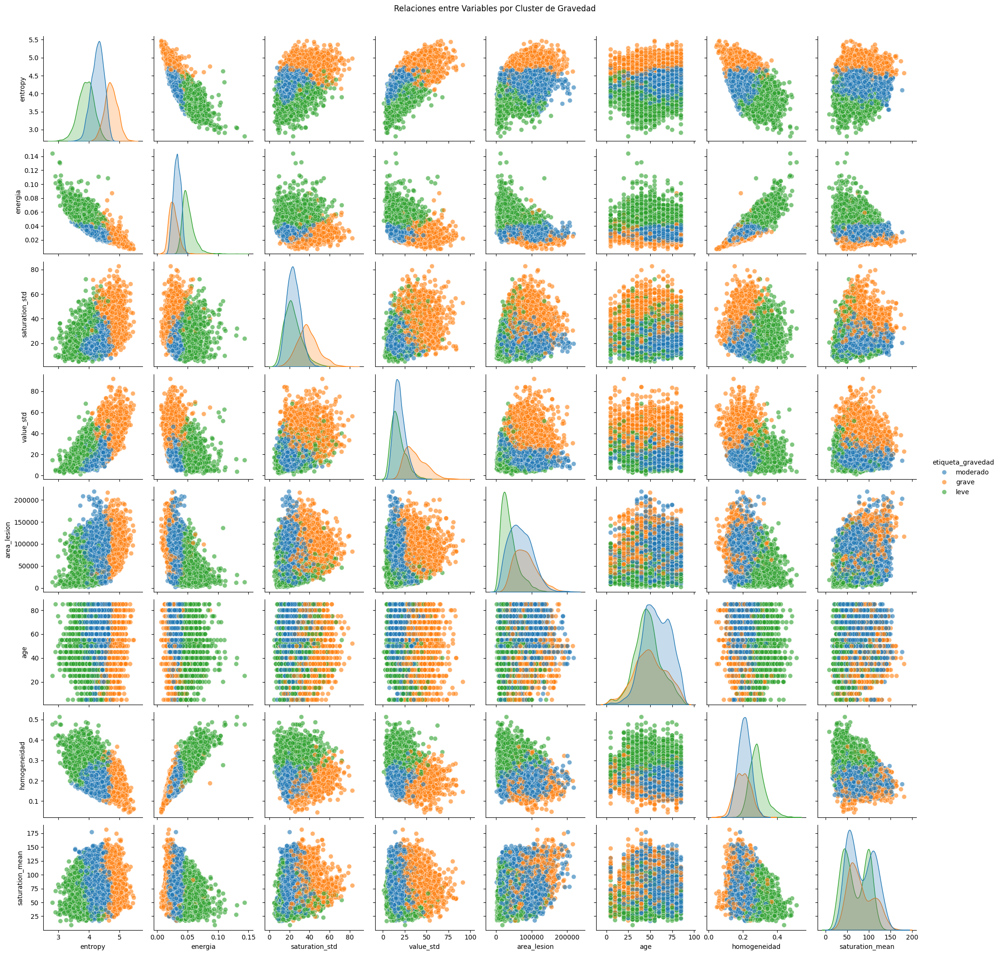

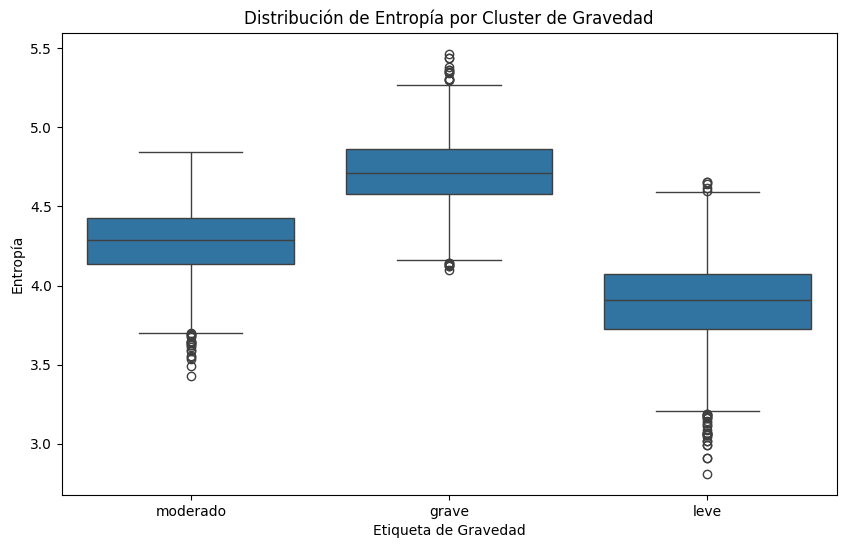

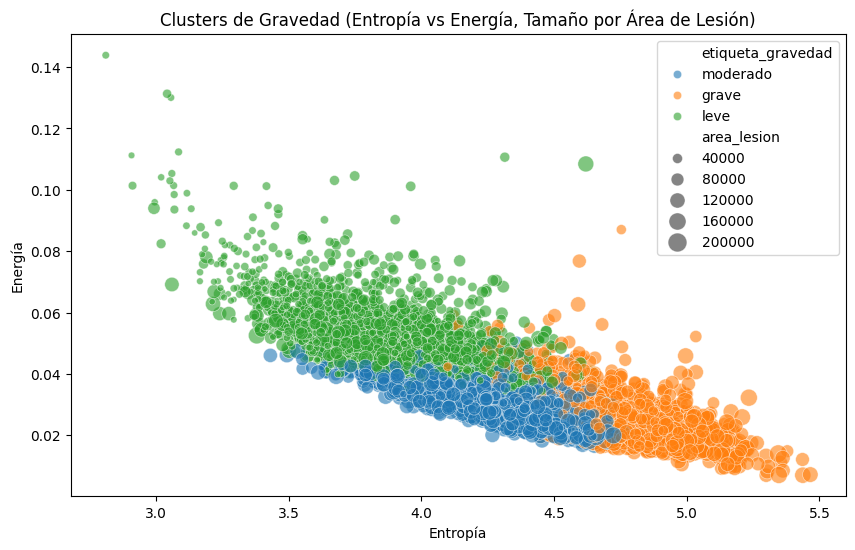


Distribución de dx_pred_xgb por etiqueta_gravedad:
dx_pred_xgb         0.0  1.0  2.0  3.0  4.0  5.0  6.0
etiqueta_gravedad                                    
grave              1438  786  147   58   43   20   11
leve               2562  229  156  187   27   70   18
moderado           2325  671  448  383  341   29   66

Estadísticas descriptivas por cluster de gravedad:
                    entropy             energia           saturation_std  \
                       mean       std      mean       std           mean   
etiqueta_gravedad                                                          
grave              4.718111  0.210736  0.026989  0.007639      38.197261   
leve               3.898319  0.260626  0.051182  0.010487      23.493216   
moderado           4.276815  0.205164  0.032508  0.005985      23.977679   

                              value_std              area_lesion  \
                         std       mean        std          mean   
etiqueta_gravedad                

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# --- Paso 1: Selección de características para clustering ---
# Combinamos variables relevantes de ambos códigos, priorizando las más importantes según XGBoost
features = [
    'entropy', 'energia', 'saturation_std', 'value_std',
    'area_lesion', 'age', 'homogeneidad', 'saturation_mean'
]

# --- Paso 2: Preparación de los datos ---
# Seleccionar características y eliminar filas con valores faltantes
X = df_all[features].dropna()

# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# --- Paso 3: Aplicar K-Means con 3 clusters ---
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Añadir los clusters al dataframe original (solo para las filas sin valores faltantes)
df_all.loc[X.index, 'gravedad_cluster'] = clusters

# --- Paso 4: Interpretar los clusters según la gravedad ---
# Mapa de gravedad basado en dx (igual que en ambos códigos)
gravedad_map = {0: 'leve', 1: 'grave', 2: 'moderado', 3: 'grave', 4: 'grave', 5: 'moderado', 6: 'moderado'}
df_all.loc[X.index, 'gravedad_dx'] = df_all.loc[X.index, 'dx'].map(gravedad_map)

# Analizar la distribución de dx por cluster
cluster_dx_dist = pd.crosstab(df_all.loc[X.index, 'gravedad_cluster'], df_all.loc[X.index, 'dx'])
print("Distribución de dx por cluster:")
print(cluster_dx_dist)

# Calcular proporción de gravedad por cluster
cluster_gravedad_dist = pd.crosstab(df_all.loc[X.index, 'gravedad_cluster'], df_all.loc[X.index, 'gravedad_dx'], normalize='index')
print("\nProporción de gravedad por cluster:")
print(cluster_gravedad_dist)

# --- Paso 5: Asignar etiquetas de gravedad a los clusters ---
# Ajusta estas etiquetas según los resultados de cluster_gravedad_dist
# Ejemplo basado en Código 2, pero revisa tus datos para confirmar
cluster_to_gravedad = {0:'grave' , 1:'leve' , 2: 'moderado'}  # Ajusta según cluster_gravedad_dist
df_all.loc[X.index, 'etiqueta_gravedad'] = df_all.loc[X.index, 'gravedad_cluster'].map(cluster_to_gravedad)

# --- Paso 6: Visualización ---
# Visualización 1: Pairplot exploratorio (del Código 1)
plt.figure(figsize=(12, 10))
sns.pairplot(
    df_all.loc[X.index],
    vars=features,
    hue='etiqueta_gravedad',
    diag_kind='kde',
    plot_kws={'alpha': 0.6, 's': 50}
)
plt.suptitle('Relaciones entre Variables por Cluster de Gravedad', y=1.02)
plt.show()

# Visualización 2: Boxplot de entropy por cluster (del Código 2)
plt.figure(figsize=(10, 6))
sns.boxplot(x='etiqueta_gravedad', y='entropy', data=df_all.loc[X.index])
plt.title('Distribución de Entropía por Cluster de Gravedad')
plt.xlabel('Etiqueta de Gravedad')
plt.ylabel('Entropía')
plt.show()

# Visualización 3: Scatter plot de entropy vs energia (del Código 2)
plt.figure(figsize=(10, 6))
sns.scatterplot(x='entropy', y='energia', hue='etiqueta_gravedad', size='area_lesion',
                sizes=(20, 200), alpha=0.6, data=df_all.loc[X.index])
plt.title('Clusters de Gravedad (Entropía vs Energía, Tamaño por Área de Lesión)')
plt.xlabel('Entropía')
plt.ylabel('Energía')
plt.show()

# --- Paso 7: Validación con XGBoost ---
# Lista completa de columnas que el modelo XGBoost espera (del clasificador original)
covariables_xgb = [
    'age', 'entropy', 'homogeneidad', 'hue_mean', 'saturation_mean', 'value_mean',
    'hue_std', 'saturation_std', 'value_std', 'contraste', 'correlacion', 'energia',
    'area_lesion', 'sex_male', 'sex_unknown', 'localization_acral', 'localization_back',
    'localization_chest', 'localization_ear', 'localization_face', 'localization_foot',
    'localization_genital', 'localization_hand', 'localization_lower extremity',
    'localization_neck', 'localization_scalp', 'localization_trunk', 'localization_unknown',
    'localization_upper extremity'
]

# Preparar datos para XGBoost
X_test_clusters = df_all.loc[X.index].copy()

# Generar columnas dummy para 'sex' y 'localization'
X_test_clusters = pd.get_dummies(X_test_clusters, columns=['sex', 'localization'], drop_first=False)

# Renombrar columnas para que coincidan con el modelo
X_test_clusters = X_test_clusters.rename(columns={
    'sex_male': 'sex_male',
    'sex_unknown': 'sex_unknown'
})

# Asegurarse de que todas las columnas esperadas estén presentes
for col in covariables_xgb:
    if col not in X_test_clusters.columns:
        X_test_clusters[col] = 0

# Seleccionar solo las columnas que el modelo espera
X_test_clusters = X_test_clusters[covariables_xgb]

# Rellenar valores faltantes con la mediana
X_test_clusters = X_test_clusters.fillna(X_test_clusters.median(numeric_only=True))

# Predecir con el modelo XGBoost (best_xgb del clasificador original)
y_pred_xgb = best_xgb.predict(X_test_clusters)

# Añadir predicciones al dataframe
df_all.loc[X.index, 'dx_pred_xgb'] = y_pred_xgb

# Comparar predicciones con clusters
print("\nDistribución de dx_pred_xgb por etiqueta_gravedad:")
print(pd.crosstab(df_all.loc[X.index, 'etiqueta_gravedad'], df_all.loc[X.index, 'dx_pred_xgb']))

# --- Paso 8: Estadísticas descriptivas por cluster ---
stats_by_cluster = df_all.loc[X.index].groupby('etiqueta_gravedad')[features].agg(['mean', 'std'])
print("\nEstadísticas descriptivas por cluster de gravedad:")
print(stats_by_cluster)

# --- Paso 9: Resultado final ---
print("\nPrimeras filas de df_all con las nuevas etiquetas:")
print(df_all.loc[X.index, ['dx', 'gravedad_cluster', 'etiqueta_gravedad', 'dx_pred_xgb']].head())

Indice de malignidad

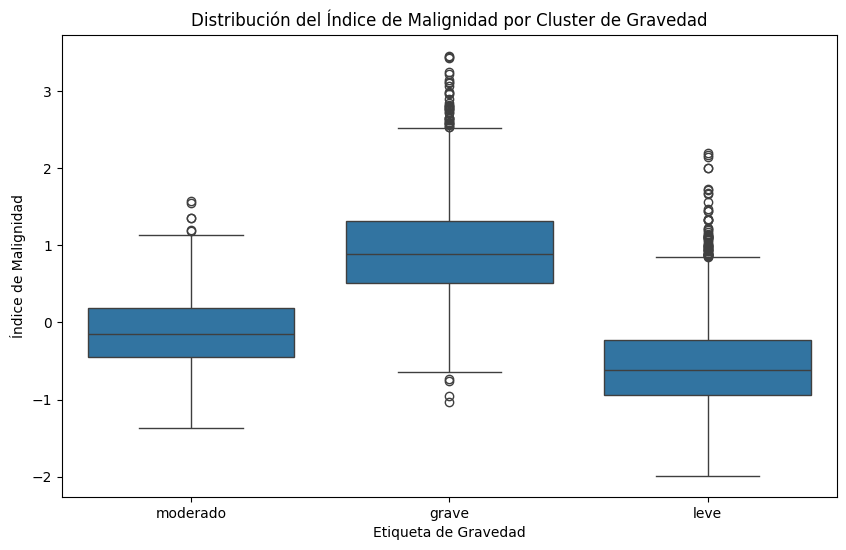


Primeras filas con el índice de malignidad:
   dx etiqueta_gravedad  indice_malignidad
0   2          moderado          -0.196554
1   2          moderado          -0.538750
2   2          moderado          -0.250902
3   2          moderado          -0.627736
4   2             grave           0.733576


In [ ]:
# --- Paso 10: Índice de malignidad continuo ---
weights = {'saturation_std': 0.072, 'area_lesion': 0.034, 'entropy': 0.020}
X_normalized = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)
df_all.loc[X.index, 'indice_malignidad'] = (
    X_normalized['saturation_std'] * weights['saturation_std'] +
    X_normalized['area_lesion'] * weights['area_lesion'] +
    X_normalized['entropy'] * weights['entropy']
) / sum(weights.values())

# Boxplot del índice por cluster
plt.figure(figsize=(10, 6))
sns.boxplot(x='etiqueta_gravedad', y='indice_malignidad', data=df_all.loc[X.index])
plt.title('Distribución del Índice de Malignidad por Cluster de Gravedad')
plt.xlabel('Etiqueta de Gravedad')
plt.ylabel('Índice de Malignidad')
plt.show()

print("\nPrimeras filas con el índice de malignidad:")
print(df_all.loc[X.index, ['dx', 'etiqueta_gravedad', 'indice_malignidad']].head())

Propiedades fisicas de la lesion

In [ ]:
# Modelo simplificado: entropy = a * irregularidad + b
a, b = 1.0, 2.0  # Ajusta estos parámetros según dominio
df_all.loc[X.index, 'irregularidad_borde'] = (df_all.loc[X.index, 'entropy'] - b) / a
print("\nEstimación de irregularidad del borde:")
print(df_all.loc[X.index, ['dx', 'etiqueta_gravedad', 'entropy', 'irregularidad_borde']].head())


Estimación de irregularidad del borde:
   dx etiqueta_gravedad   entropy  irregularidad_borde
0   2          moderado  4.264036             2.264036
1   2          moderado  4.714361             2.714361
2   2          moderado  4.207720             2.207720
3   2          moderado  4.690451             2.690451
4   2             grave  5.013511             3.013511


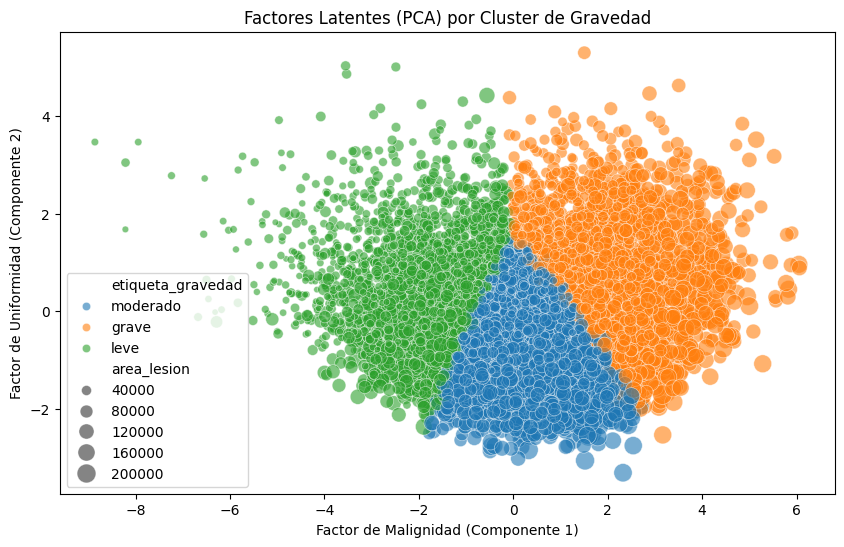


Varianza explicada por cada componente: [0.41585622 0.17577624]


In [ ]:
from sklearn.decomposition import PCA

# --- Paso 11: PCA para factores latentes ---
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
df_all.loc[X.index, 'factor_malignidad'] = X_pca[:, 0]
df_all.loc[X.index, 'factor_uniformidad'] = X_pca[:, 1]

# Visualización
plt.figure(figsize=(10, 6))
sns.scatterplot(x='factor_malignidad', y='factor_uniformidad', hue='etiqueta_gravedad',
                size='area_lesion', sizes=(20, 200), alpha=0.6, data=df_all.loc[X.index])
plt.title('Factores Latentes (PCA) por Cluster de Gravedad')
plt.xlabel('Factor de Malignidad (Componente 1)')
plt.ylabel('Factor de Uniformidad (Componente 2)')
plt.show()

print("\nVarianza explicada por cada componente:", pca.explained_variance_ratio_)

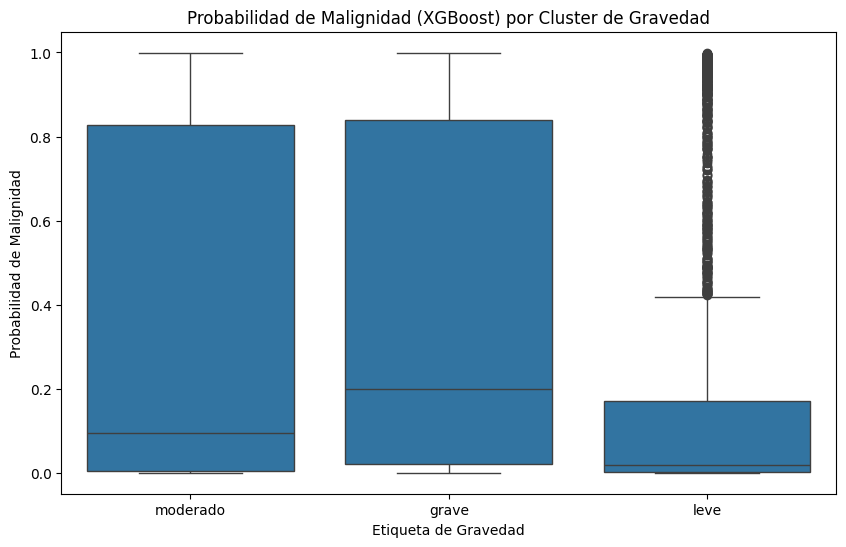

In [ ]:
# --- Paso 12: Probabilidad de malignidad desde XGBoost ---
probas = best_xgb.predict_proba(X_test_clusters)
malignas = [1, 3, 4]  # mel, bcc, akiec
df_all.loc[X.index, 'prob_malignidad'] = probas[:, malignas].sum(axis=1)

# Boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='etiqueta_gravedad', y='prob_malignidad', data=df_all.loc[X.index])
plt.title('Probabilidad de Malignidad (XGBoost) por Cluster de Gravedad')
plt.xlabel('Etiqueta de Gravedad')
plt.ylabel('Probabilidad de Malignidad')
plt.show()

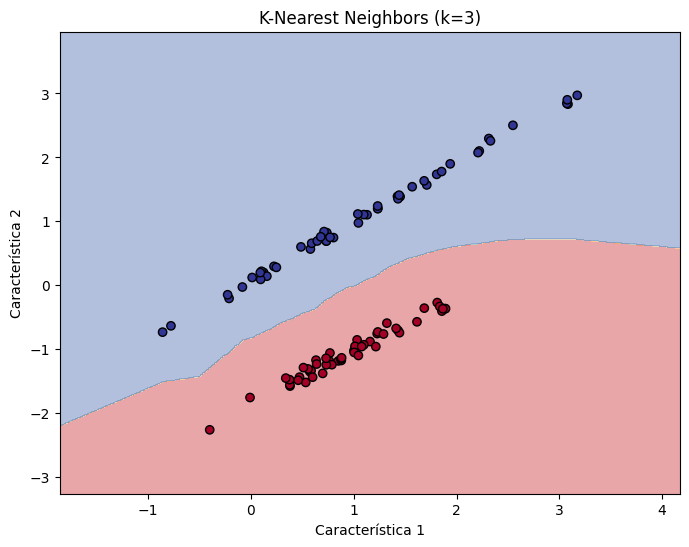

In [ ]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.neighbors import KNeighborsClassifier
import numpy as np

# Crear un conjunto de datos sintético
X, y = make_classification(n_samples=100, n_features=2, n_redundant=0,
                           n_clusters_per_class=1, n_classes=2, random_state=42)

# Crear y entrenar el modelo KNN
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X, y)

# Crear una malla de puntos para visualizar las fronteras de decisión
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01),
                     np.arange(y_min, y_max, 0.01))

# Predecir para cada punto en la malla
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Graficar
plt.figure(figsize=(8,6))
plt.contourf(xx, yy, Z, alpha=0.4, cmap=plt.cm.RdYlBu)
plt.scatter(X[:, 0], X[:, 1], c=y, edgecolor='k', cmap=plt.cm.RdYlBu, marker='o')
plt.title('K-Nearest Neighbors (k=3)')
plt.xlabel('Característica 1')
plt.ylabel('Característica 2')
plt.show()
